In [3970]:
import pandas as pd
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import re

from sklearn.preprocessing import LabelEncoder


import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

In [3971]:
df = pd.read_csv("Data/listings.csv", sep = ",")

## Data Cleaning

### [price] Dropping listings without price

In [3974]:
df.price.isna().sum()

972

In [3975]:
df = df.dropna(subset = "price")

### [price] Converting to Numeric Values

In [3977]:
# Price
df["price"] = df["price"].apply(lambda x: float(x[1:].replace(",","")) if pd.notna(x) else x)

### Host Features

In [3979]:
re_host = "host.*"

host_feat = []

for feat in df.columns:
    if re.match(re_host, feat):
         host_feat.append(feat)

host_drop = ["host_id", "host_url", "host_name", "host_location", "host_about", "host_thumbnail_url", 
             "host_picture_url", "host_neighbourhood", "host_since", "host_listings_count", "host_total_listings_count"]

df = df.drop(host_drop, axis = 1)

### Id Features

In [3981]:
re_id = ".*id.*"

id_feat = []

for feat in df.columns:
    if re.match(re_id, feat):
         id_feat.append(feat)

id_drop = ["id", "scrape_id"]

df = df.drop(id_drop, axis = 1)

### Url features

In [3983]:
re_url = ".*url.*"

url_feat = []

for feat in df.columns:
    if re.match(re_url, feat):
        url_feat.append(feat)
        
url_drop = ["listing_url", "picture_url"]

df = df.drop(url_drop, axis = 1)

### Others to drop

In [3985]:
## Majority missing values
feat_na = df.isna().sum()

print(feat_na[feat_na > 0].sort_values(ascending = False))

nas_drop = ["calendar_updated", "license", "neighbourhood_group_cleansed", "neighbourhood", "neighborhood_overview"]
df = df.drop(nas_drop, axis = 1)

calendar_updated                33692
license                         33692
neighbourhood_group_cleansed    33692
neighbourhood                   17123
neighborhood_overview           17123
review_scores_value              8101
review_scores_location           8099
review_scores_communication      8099
review_scores_checkin            8099
review_scores_cleanliness        8099
review_scores_accuracy           8099
first_review                     8090
review_scores_rating             8090
last_review                      8090
reviews_per_month                8090
host_response_rate               5605
host_response_time               5605
host_acceptance_rate             3431
description                      1130
host_is_superhost                 833
has_availability                  292
bathrooms_text                     39
bedrooms                           38
beds                               24
bathrooms                          23
dtype: int64


In [3986]:
feat_not_relevant = ["last_scraped", "source", "first_review", "last_review", "name", "description",
                    "calculated_host_listings_count", "calculated_host_listings_count_entire_homes",
                    "calculated_host_listings_count_private_rooms", "calculated_host_listings_count_shared_rooms", "calendar_last_scraped"]

# neighbourhood is better represented in neighbourhood_cleansed
df = df.drop(feat_not_relevant, axis = 1)

# EDA

In [3988]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33692 entries, 0 to 34663
Data columns (total 44 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   host_response_time           28087 non-null  object 
 1   host_response_rate           28087 non-null  object 
 2   host_acceptance_rate         30261 non-null  object 
 3   host_is_superhost            32859 non-null  object 
 4   host_verifications           33692 non-null  object 
 5   host_has_profile_pic         33692 non-null  object 
 6   host_identity_verified       33692 non-null  object 
 7   neighbourhood_cleansed       33692 non-null  object 
 8   latitude                     33692 non-null  float64
 9   longitude                    33692 non-null  float64
 10  property_type                33692 non-null  object 
 11  room_type                    33692 non-null  object 
 12  accommodates                 33692 non-null  int64  
 13  bathrooms            

### Outliers (numerical)

In [3990]:
# Numerical
df_numerical = df.select_dtypes(exclude = 'object')
df_numerical.iloc[:, 0:15].describe()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm
count,33692.000000,33692.000000,33692.000000,33669.000000,33654.000000,33668.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000
mean,-22.967648,-43.248488,4.014573,1.552021,1.554228,2.273702,731.188235,3.609878,418.068651,3.313754,4.238454,514.388668,541.715452,3.660080,527.181221
std,0.034585,0.099622,2.338461,1.007791,1.048019,2.099953,5667.250477,13.741494,414.058955,11.496638,14.037076,451.965922,455.813598,12.376104,449.293283
min,-23.073276,-43.723009,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,-22.984630,-43.302590,2.000000,1.000000,1.000000,1.000000,199.000000,1.000000,60.000000,1.000000,2.000000,90.000000,90.000000,1.300000,90.000000
50%,-22.972959,-43.194267,4.000000,1.000000,1.000000,2.000000,307.000000,2.000000,365.000000,2.000000,3.000000,365.000000,365.000000,2.000000,365.000000
75%,-22.956848,-43.185430,5.000000,2.000000,2.000000,3.000000,572.000000,3.000000,365.000000,3.000000,4.000000,1125.000000,1125.000000,3.000000,1125.000000
max,-22.749950,-43.104400,16.000000,29.000000,30.000000,56.000000,633125.000000,1000.000000,1125.000000,630.000000,1125.000000,1125.000000,1125.000000,630.000000,1125.000000


In [3991]:
df_numerical.iloc[:, 15:].describe()

,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
count,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,25602.000000,25593.000000,25593.000000,25593.000000,25593.000000,25593.000000,25591.000000,25602.000000
mean,20.234240,43.837706,66.071916,205.605574,22.593078,7.761160,0.568978,4.802834,4.816552,4.765509,4.891744,4.881205,4.865371,4.720408,1.094172
std,10.940623,19.906377,27.822150,114.708959,44.422247,12.093625,1.149566,0.360016,0.356751,0.399811,0.281986,0.296750,0.290990,0.403923,1.200897
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.010000
25%,11.000000,32.000000,52.000000,90.000000,1.000000,0.000000,0.000000,4.750000,4.780000,4.690000,4.890000,4.880000,4.850000,4.650000,0.230000
50%,26.000000,54.000000,79.000000,193.000000,5.000000,2.000000,0.000000,4.920000,4.930000,4.900000,5.000000,5.000000,4.970000,4.820000,0.680000
75%,29.000000,59.000000,89.000000,322.000000,24.000000,11.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.550000
max,30.000000,60.000000,90.000000,365.000000,674.000000,132.000000,20.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,16.960000


In [3992]:
df_numerical.columns

Index(['latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'price', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'reviews_per_month'],
      dtype='object')

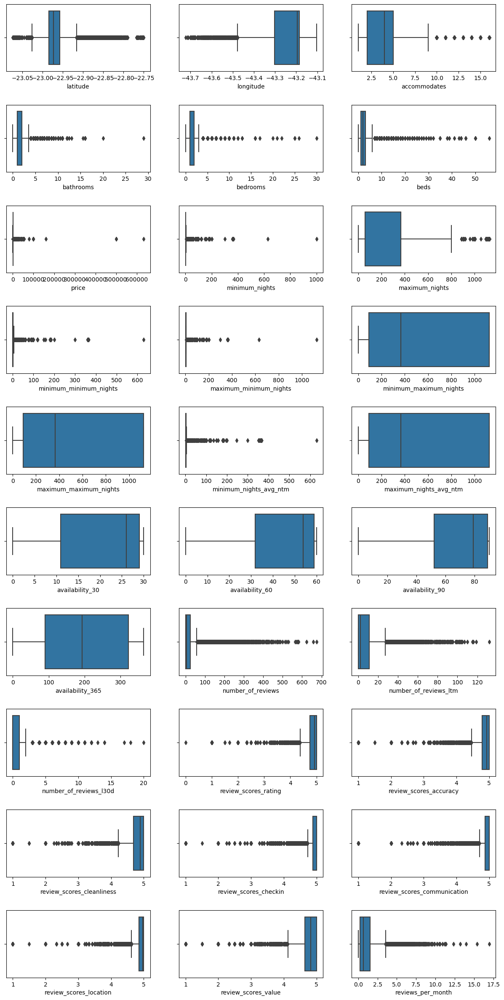

In [3993]:
fig, ax = plt.subplots(nrows = 10, ncols = 3, figsize=(15,30))
fig.subplots_adjust(hspace=0.5)

line = 0
col = 0
index = [0,0]
for feat in df_numerical:        
    #Plot boxplot of current feature
    sns.boxplot(data = df,x = feat, ax = ax[line, col])
        
    #Update index for plotting for the next iteration
    if(col + 1 == 3):
        col = 0
        line += 1
    else:
        col +=1

### [price] Outliers

count     33692.000000
mean        731.188235
std        5667.250477
min           0.000000
25%         199.000000
50%         307.000000
75%         572.000000
max      633125.000000
Name: price, dtype: float64


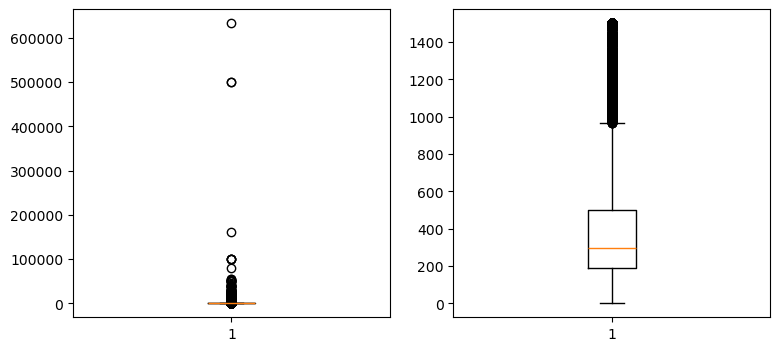

In [3995]:
# Outliers
PRICE_CAP = 1500
print(df.price.describe())

fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(9, 4))

axis[0].boxplot(df.price)
axis[1].boxplot(df.loc[df.price <= PRICE_CAP,:].price)

plt.show()


### TO DO

df.price = df.price.apply(lambda x : x if x < PRICE_CAP else PRICE_CAP)

#df = df.loc[df.price <= PRICE_CAP,:]

### Distribution (categorical)

In [3997]:
df_categorical = df.select_dtypes(include = "object")
df_categorical = df_categorical.drop("amenities", axis = 1) #Will de dealt with later
df_categorical.columns

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood_cleansed', 'property_type',
       'room_type', 'bathrooms_text', 'has_availability', 'instant_bookable'],
      dtype='object')

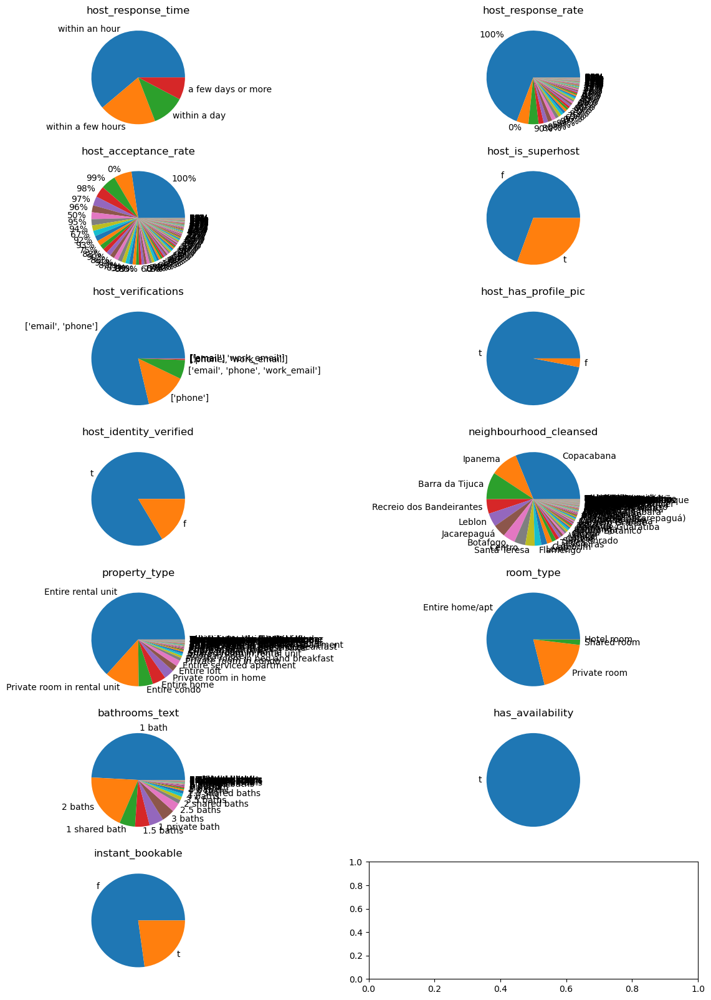

In [3998]:
fig, ax = plt.subplots(nrows = 7, ncols = 2, figsize = (15,20))

line = 0
col = 0

for feat in df_categorical:
    
    ax[line,col].pie(df[feat].value_counts(), labels = df[feat].value_counts().index)
    ax[line,col].title.set_text(feat)
    
    if(col + 1  == 2):
        col = 0
        line += 1
    else:
        col +=1

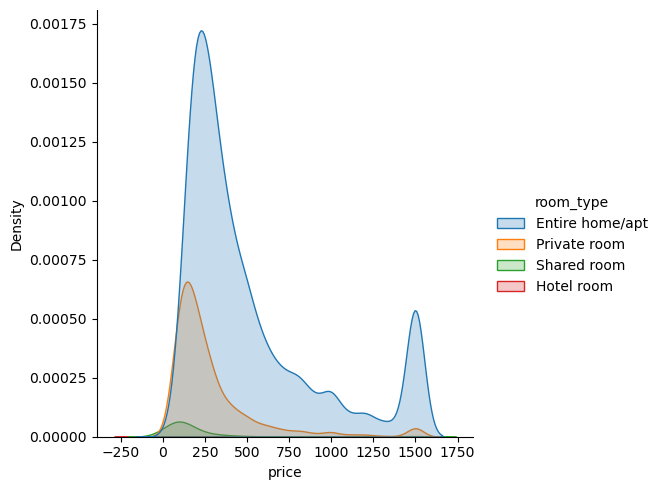

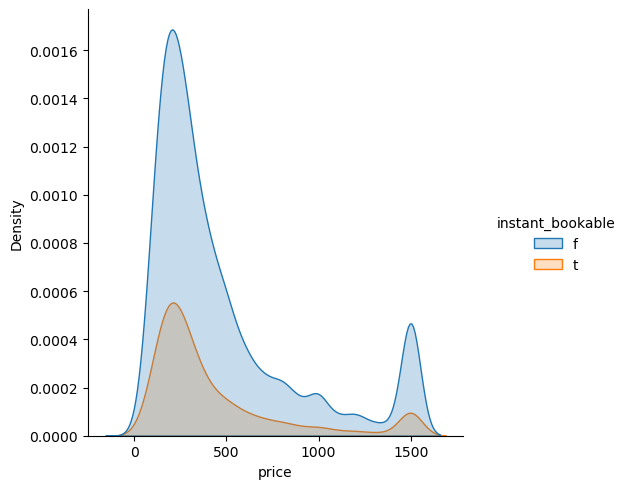

In [3999]:
sns.displot(df, x = "price", hue = "room_type", kind = "kde", fill = "True")
sns.displot(df, x = "price", hue = "instant_bookable", kind = "kde", fill = "True")



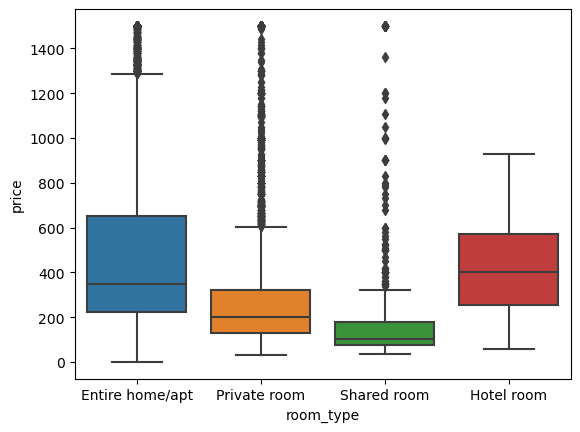

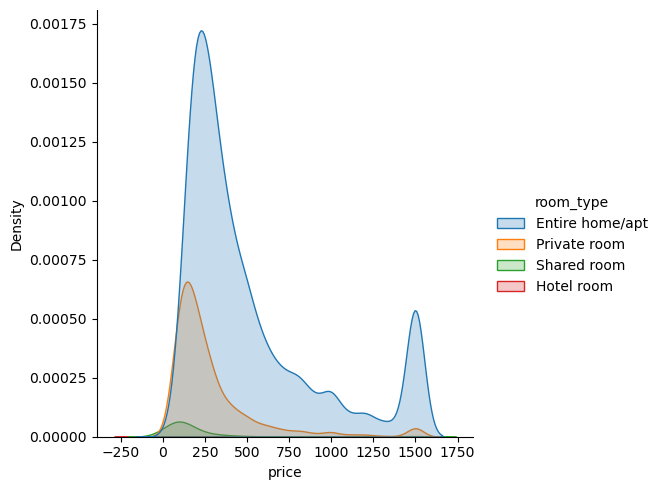

In [4000]:
#Checking skeweness
sns.boxplot(data = df, x = df["room_type"], y=df.price)

# Distribution of Data
sns.displot(df, x = "price", hue = "room_type", kind = "kde", fill = "True")

#sns.displot(penguins, x="flipper_length_mm", hue="species", kind="kde")

<Axes: xlabel='accommodates', ylabel='price'>

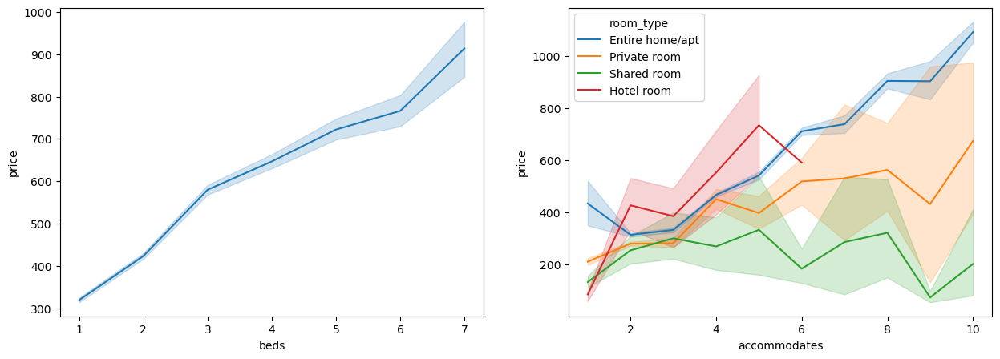

In [4001]:
fig, ax = plt.subplots(1,2, figsize=(15,5))

# Min 1 bed and max 7 beds
sns.lineplot(ax =ax[0] , data = df.loc[(df.beds <=7) & (df.beds > 0),:], x="beds", y="price")

# Min 1 ppl and max 10 ppl
sns.lineplot(ax = ax[1], data = df.loc[(df.accommodates <=10) & (df.accommodates > 0),:], x="accommodates", y="price", hue = "room_type")

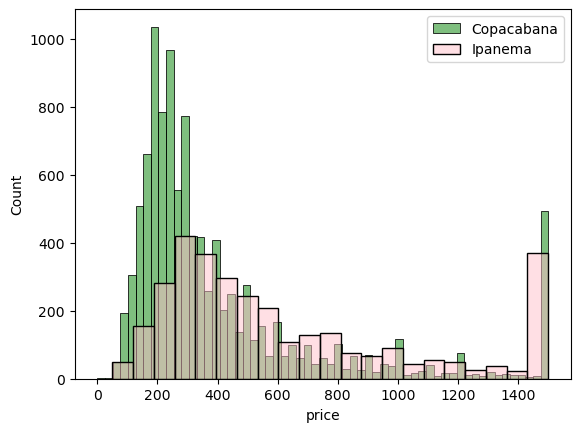

In [4002]:
sns.histplot(df.loc[df.neighbourhood_cleansed == "Copacabana",:], x = "price", color = "green", alpha = 0.5)
sns.histplot(df.loc[df.neighbourhood_cleansed == "Ipanema",:], x = "price", color = "pink", alpha= 0.5)
plt.legend(['Copacabana', 'Ipanema'],loc="upper right")

In [4003]:
#Cross tab
pd.crosstab(index = df.neighbourhood_cleansed, columns = df.room_type).sort_values("Entire home/apt", ascending = False).head(10)

room_type,Entire home/apt,Hotel room,Private room,Shared room
neighbourhood_cleansed,,,,
Copacabana,8882,1,1496,123
Ipanema,2832,1,369,24
Barra da Tijuca,2667,4,469,10
Leblon,1454,2,118,1
Recreio dos Bandeirantes,1388,0,287,19
Jacarepaguá,1164,1,291,30
Centro,1080,6,180,22
Botafogo,980,4,401,26
Flamengo,609,0,161,11


In [4004]:
# Pivot Table
pivot_df = pd.pivot_table(df, values = "price",
                   index = "neighbourhood_cleansed",
                   aggfunc = "mean").sort_values(by = "price", ascending = False)

#Series with the counts
counts = df.neighbourhood_cleansed.value_counts()

#Merge occurancies with price grouped by the neighbourhood
pivot_df.merge(counts, left_on = "neighbourhood_cleansed", right_on = "neighbourhood_cleansed").head(5)

,price,count
neighbourhood_cleansed,,
Joá,1232.417266,139
Galeão,1083.333333,3
São Conrado,842.252427,309
Anchieta,719.333333,3
Lagoa,687.066929,254


### Number of nights

In [4006]:
# minimum_nights
# minimum_minimum_nights
# minimum_maximum_nights
# minimum_nights_avg_ntm

df[[x for x in df.columns if re.match("minimum.*", x)]]

,minimum_nights,minimum_minimum_nights,minimum_maximum_nights,minimum_nights_avg_ntm
0,5,5,28,5.0
1,2,2,60,2.0
2,1,1,1125,1.0
3,3,3,15,3.0
4,1,5,1125,5.4
...,...,...,...,...
34659,2,2,365,2.5
34660,2,2,365,2.0
34661,2,2,15,2.1
34662,2,2,365,2.0


In [4007]:
# Values are pretty much the same (differnce = 0)
print(df.apply(lambda x: x["minimum_nights"] - x["minimum_minimum_nights"], axis = 1).value_counts())

#Values are pretty much all captured with minimum_nights and maximum_nights
drop_min_max = ["minimum_minimum_nights", "maximum_minimum_nights", "minimum_maximum_nights", "maximum_maximum_nights", "minimum_nights_avg_ntm", "maximum_nights_avg_ntm"]

df = df.drop(drop_min_max, axis = 1)

 0      29875
 1       1965
 2        708
-1        430
 3        225
        ...  
 30         1
 70         1
 199        1
-88         1
 87         1
Name: count, Length: 70, dtype: int64


In [4008]:
df.columns

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'instant_bookable',
       'reviews_per_month'],
      dtype='object')

### Location Analysis

In [4010]:
df.price.count()

33692

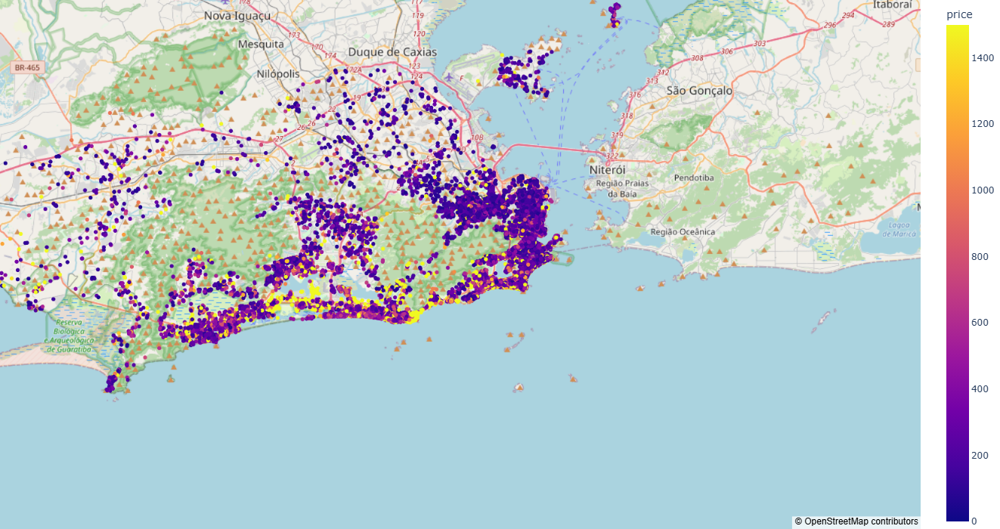

In [4011]:
fig = px.scatter_mapbox(df, 
                  lat="latitude", 
                  lon="longitude",     
                  color="price",  
                  size_max=15, 
                  zoom=10,
                  height = 700,
                  mapbox_style = "open-street-map")


fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")

### Outliers

##### Neighborhoods

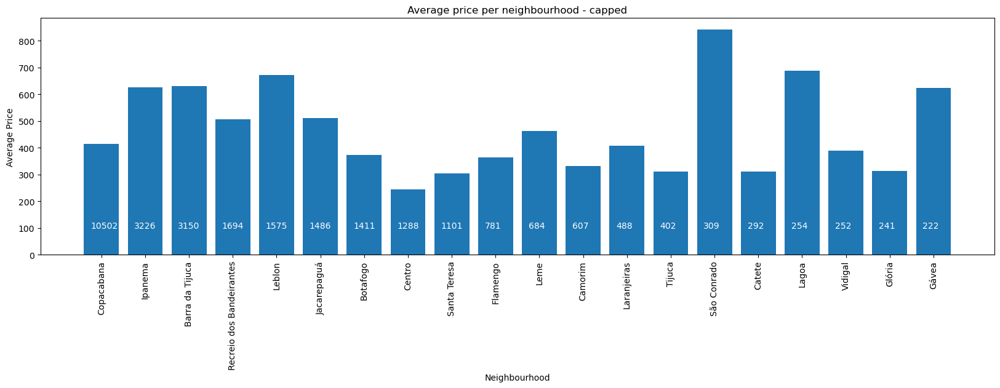

In [4014]:
NEIGHBOURHOOD_SAMPLES_CAP = 200

df_avg_neighbourhood = df[["neighbourhood_cleansed", "price"]].groupby("neighbourhood_cleansed").agg(count=('neighbourhood_cleansed','size'),
                                                                              price=('price', 'mean')).sort_values("count", ascending = False)
avg_neighbourhood = df_avg_neighbourhood.loc[df_avg_neighbourhood["count"] >= NEIGHBOURHOOD_SAMPLES_CAP].price
avg_neighbourhood_count = df_avg_neighbourhood.loc[df_avg_neighbourhood["count"] >= NEIGHBOURHOOD_SAMPLES_CAP]["count"]

sample_size = len(avg_neighbourhood.index)


plt.figure(figsize=(20, 5))
plt.bar(x = avg_neighbourhood.index, height = avg_neighbourhood)
labels = plt.xticks(rotation=90)

#Will display the count for each neighbourhood
for i in range(sample_size):
    plt.text(i-0.25,100, avg_neighbourhood_count[i], color = "white")

plt.title("Average price per neighbourhood - capped")
plt.ylabel("Average Price")
plt.xlabel("Neighbourhood")

plt.show()


# Filter to keep only representative neighbourhoods (NEIGHBOURHOOD_SAMPLES_CAP)
#list_neighbourhood_filtered = [x for x in avg_neighbourhood.index]
#df = df.loc[df.neighbourhood_cleansed.isin(list_neighbourhood_filtered), :]

In [4015]:
# Max number of neighborhoods we are considering
max_neighbourhood = 9

# Group the dataset by neighbourhood and count how many properties for each neighbourhood
df_count_neighbourhood = df.groupby("neighbourhood_cleansed").size().reset_index(name = "count").sort_values(by = "count", ascending = False)


# Select only the #max_neighbourhood neighbourhoods with the most properties
list_of_neighbourhood = df_count_neighbourhood.head(max_neighbourhood).neighbourhood_cleansed.unique()

# Filter the dataset to contain only those neighbourhoods, eliminating the outliers
df = df.loc[df["neighbourhood_cleansed"].isin(list_of_neighbourhood), :]

In [4016]:
df.neighbourhood_cleansed.unique()

array(['Copacabana', 'Ipanema', 'Jacarepaguá', 'Botafogo',
       'Barra da Tijuca', 'Santa Teresa', 'Leblon',
       'Recreio dos Bandeirantes', 'Centro'], dtype=object)

##### Bedrooms

In [4018]:
# Remove instances where value for beds and bedrooms are both 0
#df.loc[(df["bedrooms"] == 0) & (df["beds"] == 0), :].count()

df = df.loc[(df["bedrooms"] != 0) & (df["beds"] != 0), :]

##### Bathrooms

In [4020]:
df.columns
df.describe()
#Filtering bathroom > 5
#df = df.loc[df.bathrooms <= 5, :]
df.bathrooms = df.bathrooms.apply(lambda x: x if x <= 5 else 5)

#Filtering bedrooms > 5
#df = df.loc[df.bedrooms <= 5, :]
df.bedrooms = df.bedrooms.apply(lambda x: x if x <= 5 else 5)

#Filtering beds > 8
#df = df.loc[df.beds <= 8, :]
df.beds = df.beds.apply(lambda x: x if x <= 8 else 8)

df.describe()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,availability_30,...,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
count,22395.000000,22395.000000,22395.000000,22395.000000,22395.000000,22395.000000,22395.000000,22395.000000,22395.000000,22395.000000,...,22395.000000,22395.000000,17717.000000,17711.000000,17712.000000,17711.000000,17711.000000,17711.000000,17709.000000,17717.000000
mean,-22.975815,-43.242705,4.087653,1.551842,1.611610,2.454164,492.968163,3.659388,422.265729,19.720965,...,8.615361,0.600982,4.796281,4.813418,4.760670,4.890413,4.876466,4.881705,4.710136,1.115509
std,0.025950,0.092883,2.173370,0.836086,0.870866,1.534075,396.817220,11.868989,422.938945,10.944107,...,12.492521,1.129950,0.354509,0.346571,0.390012,0.270074,0.295313,0.263360,0.397372,1.168449
min,-23.035190,-43.521930,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.010000
25%,-22.985375,-43.300285,2.000000,1.000000,1.000000,1.000000,217.000000,2.000000,60.000000,10.000000,...,0.000000,0.000000,4.740000,4.770000,4.680000,4.880000,4.870000,4.860000,4.630000,0.240000
50%,-22.977870,-43.192590,4.000000,1.000000,1.000000,2.000000,347.000000,2.000000,365.000000,25.000000,...,3.000000,0.000000,4.900000,4.920000,4.880000,4.980000,4.980000,4.970000,4.810000,0.720000
75%,-22.965784,-43.186292,5.000000,2.000000,2.000000,3.000000,603.500000,3.000000,730.000000,29.000000,...,13.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.960000,1.620000
max,-22.896358,-43.165370,16.000000,5.000000,5.000000,8.000000,1500.000000,365.000000,1125.000000,30.000000,...,132.000000,17.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,15.370000


### Correlation Heatmap

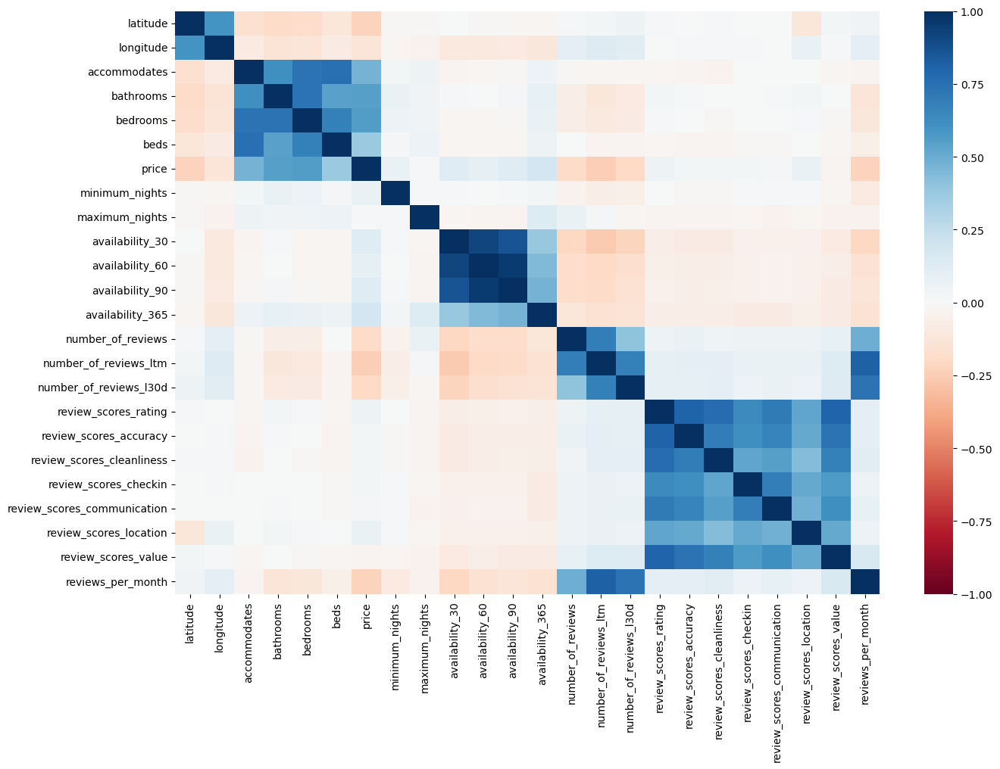

In [4022]:
plt.figure(figsize=(15,10))
correlations = df.corr(numeric_only=True)
sns.heatmap(round(correlations,2), cmap='RdBu', annot=False, 
            annot_kws={"size": 7}, vmin=-1, vmax=1);

In [4023]:
# IDEA:
# Get coordinate information to delimite a beach front area and then create another column that indicated if the property is
# at the beach or not

In [4024]:
# Number of review ltm vs price

df.corr(numeric_only = True)["price"].sort_values(ascending = False, key = abs)

price                          1.000000
bedrooms                       0.559823
bathrooms                      0.550376
accommodates                   0.465421
beds                           0.365209
number_of_reviews_ltm         -0.249573
reviews_per_month             -0.233019
latitude                      -0.225578
number_of_reviews_l30d        -0.198560
number_of_reviews             -0.186510
availability_365               0.177939
longitude                     -0.125821
availability_90                0.124496
availability_30                0.121042
availability_60                0.094959
review_scores_location         0.070773
minimum_nights                 0.065141
review_scores_rating           0.047568
review_scores_value           -0.031310
review_scores_accuracy         0.025495
review_scores_checkin          0.025168
review_scores_cleanliness      0.025141
review_scores_communication    0.022610
maximum_nights                 0.005440
Name: price, dtype: float64

#### Reviews Analysis

##### LTM (Last 12 months) Reviews

Text(0.5, 0, 'Price')

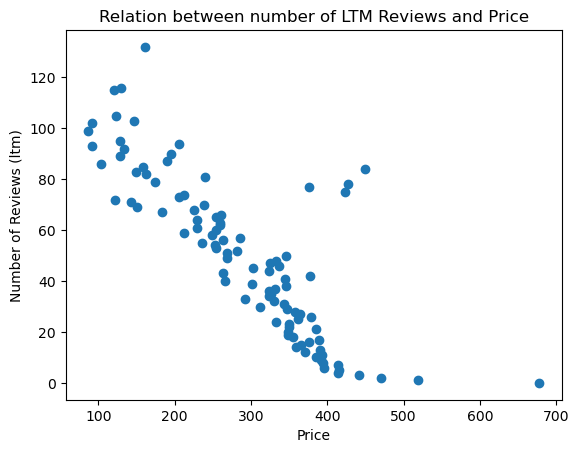

In [4027]:
# The lower the number of reviews, the higher the price
# It makes sense as lessp eople would stay in a high price property compared to a low one.

df_price_reviews = df.loc[:,["number_of_reviews_ltm", "price"]].groupby("number_of_reviews_ltm").mean().sort_values(by = "price", ascending = False)

plt.scatter(x = df_price_reviews.price, y = df_price_reviews.index)
plt.title("Relation between number of LTM Reviews and Price")
plt.ylabel("Number of Reviews (ltm)")
plt.xlabel("Price")

##### Reviews per Month

Text(0.5, 0, 'Price')

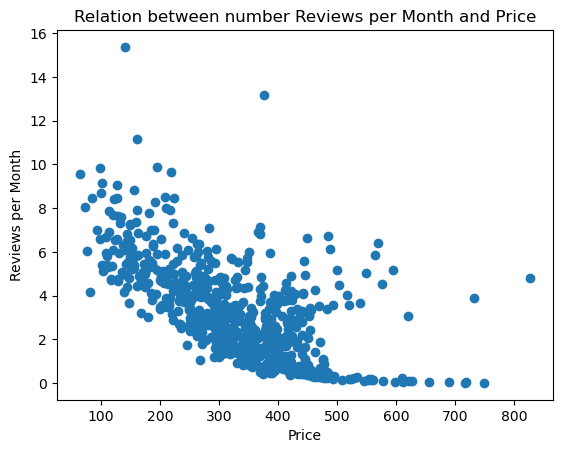

In [4029]:
df_price_reviews = df.loc[:,["reviews_per_month", "price"]].groupby("reviews_per_month").mean().sort_values(by = "price", ascending = False)

plt.scatter(x = df_price_reviews.price, y = df_price_reviews.index)
plt.title("Relation between number Reviews per Month and Price")
plt.ylabel("Reviews per Month")
plt.xlabel("Price")

##### Reviews last 30 days

Text(0.5, 0, 'Price')

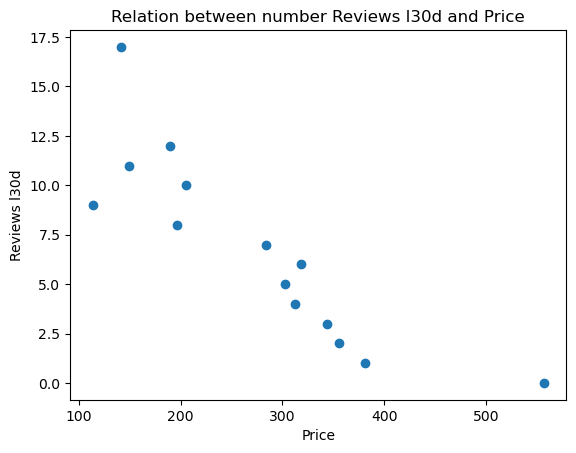

In [4031]:
df_price_reviews = df.loc[:,["number_of_reviews_l30d", "price"]].groupby("number_of_reviews_l30d").mean().sort_values(by = "price", ascending = False)

plt.scatter(x = df_price_reviews.price, y = df_price_reviews.index)
plt.title("Relation between number Reviews l30d and Price")
plt.ylabel("Reviews l30d")
plt.xlabel("Price")

##### Number of Reviews

Text(0.5, 0, 'Price')

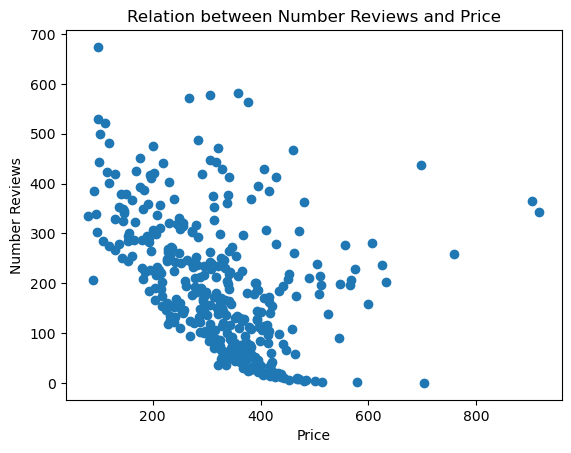

In [4033]:
df_price_reviews = df.loc[:,["number_of_reviews", "price"]].groupby("number_of_reviews").mean().sort_values(by = "price", ascending = False)

plt.scatter(x = df_price_reviews.price, y = df_price_reviews.index)
plt.title("Relation between Number Reviews and Price")
plt.ylabel("Number Reviews")
plt.xlabel("Price")

In [4034]:
# Filling missing values of Reviews per Month with 0 as the majority correspond to 0 for the LTM Reviews - which could indicate there was no review at the moment

print(df.reviews_per_month.isna().sum())

df.reviews_per_month = df.reviews_per_month.fillna(0)

4678


In [4035]:
cols = ["minimum_nights", "maximum_nights", "price"]
df[cols]

,minimum_nights,maximum_nights,price
0,5,28,310.0
1,2,60,203.0
3,3,15,201.0
4,1,730,321.0
5,3,89,160.0
...,...,...,...
34658,3,365,270.0
34659,2,365,673.0
34660,2,365,208.0
34661,2,15,729.0


In [4036]:
# Dropping features not relevant: 


# availability_365
# host_is_superhost
# minimum_nights
# has_availability

drop_feat = ["availability_365", "minimum_nights", 
             "maximum_nights", "availability_30", 
             "availability_60", "availability_90"]

df = df.drop(drop_feat, axis = 1)

#### Score

In [4038]:
# Dropping reviews score. Low correlation

# review_scores_value
# review_scores_rating
# review_scores_accuracy
# review_scores_checkin
# review_scores_cleanliness
# review_scores_communication
# review_scores_location 

#  "review_scores_rating"

drop_reviews = [
               "review_scores_value", "review_scores_accuracy", "review_scores_rating",
               "review_scores_checkin", "review_scores_cleanliness", "review_scores_communication",
               "review_scores_location"]

df = df.drop(drop_reviews, axis = 1)

In [4039]:
print(df.isna().sum())

#df = df.dropna()

host_response_time        3326
host_response_rate        3326
host_acceptance_rate      1970
host_is_superhost          628
host_verifications           0
host_has_profile_pic         0
host_identity_verified       0
neighbourhood_cleansed       0
latitude                     0
longitude                    0
property_type                0
room_type                    0
accommodates                 0
bathrooms                    0
bathrooms_text              26
bedrooms                     0
beds                         0
amenities                    0
price                        0
has_availability           143
number_of_reviews            0
number_of_reviews_ltm        0
number_of_reviews_l30d       0
instant_bookable             0
reviews_per_month            0
dtype: int64


### Categorical Data

In [4041]:
# instant_bookable - low correlation
# has_availability - same value for all/majority
low_corr = ["has_availability", "instant_bookable"]

df = df.drop(low_corr, axis = 1)

Text(0.5, 1.0, 'Acceptance rate X Price')

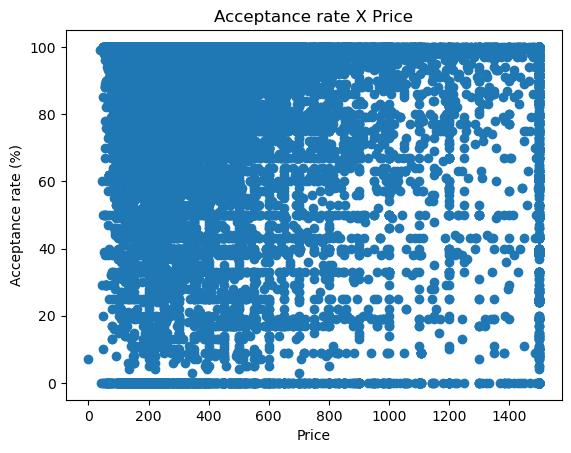

In [4042]:
#We can see from the chart below that the response rate does not influence the price, as we have low and high prices with 100% repsonse rate for example

df.host_acceptance_rate = df.host_acceptance_rate.apply(lambda x : float(x.split("%")[0]) if isinstance(x, str) else x)
plt.scatter(x = df.price, y = df.host_acceptance_rate)
plt.ylabel("Acceptance rate (%)")
plt.xlabel("Price")
plt.title("Acceptance rate X Price")

Text(0.5, 1.0, 'Response rate X Price')

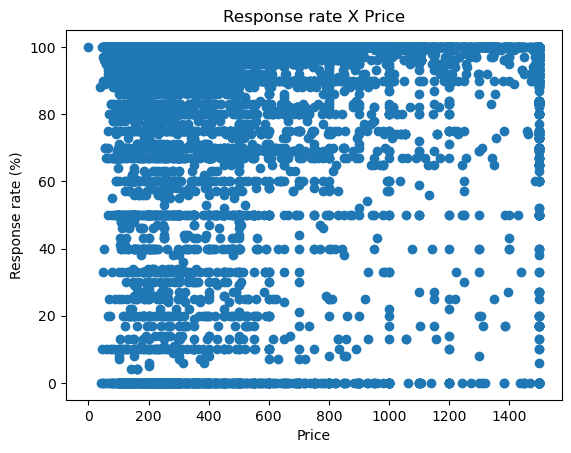

In [4043]:
# Same results for response rate

df.host_response_rate = df.host_response_rate.apply(lambda x : float(x.split("%")[0]) if isinstance(x, str) else x)
plt.scatter(x = df.price, y = df.host_response_rate)
plt.ylabel("Response rate (%)")
plt.xlabel("Price")
plt.title("Response rate X Price")

In [4044]:
# Host Super Host
# No apparent real correlation: superhost has an average lower price.
# Also, superhost are a minority.

print(df.groupby("host_is_superhost").mean(numeric_only = True).price)
print(df.host_is_superhost.value_counts())

host_is_superhost
f    529.218684
t    423.870918
Name: price, dtype: float64
host_is_superhost
f    14601
t     7166
Name: count, dtype: int64


In [4045]:
# Drop Response/Acceptance rate
df = df.drop(["host_response_rate", "host_acceptance_rate", "host_is_superhost"], axis = 1)

In [4046]:
# Removing low correlations 
low_corr = ["host_has_profile_pic", "host_identity_verified"]
df = df.drop(low_corr, axis = 1)

### Dealing with Nans

In [4048]:
df.isna().sum()

host_response_time        3326
host_verifications           0
neighbourhood_cleansed       0
latitude                     0
longitude                    0
property_type                0
room_type                    0
accommodates                 0
bathrooms                    0
bathrooms_text              26
bedrooms                     0
beds                         0
amenities                    0
price                        0
number_of_reviews            0
number_of_reviews_ltm        0
number_of_reviews_l30d       0
reviews_per_month            0
dtype: int64

In [4049]:
# host_response_time

df.isna().sum()

le = LabelEncoder()

copy_df = pd.DataFrame()
copy_df["host_response_time"] = le.fit_transform(df.host_response_time)
copy_df["price"] = df.price

#host_response_time does not correlate to the price
# We solve the Nan problem as well
print(copy_df.corr())

df = df.drop("host_response_time", axis = 1)

                    host_response_time     price
host_response_time            1.000000  0.004106
price                         0.004106  1.000000


In [4050]:
# bathrooms - contains the same information about the number of bathrooms as bathrooms_text
# bathrooms_text - keeping this feature for later extraction of private/shared bathroom information. It will be dropped later

df = df.dropna(subset = "bathrooms")

In [4051]:
# bedrooms - cannot impute the value based on the dataset. So dropping all these nas
# beds - same reason for beds

df = df.dropna(subset = ["bedrooms", "beds"])

### Property Type

In [4053]:
# property_type: info  already capture with is_entire_property
# host_verifications: majority of values are the same

df = df.drop(["property_type", "host_verifications"], axis = 1)
#df = df.drop(["host_verifications"], axis = 1)

In [4054]:
df.isna().sum()

neighbourhood_cleansed     0
latitude                   0
longitude                  0
room_type                  0
accommodates               0
bathrooms                  0
bathrooms_text            26
bedrooms                   0
beds                       0
amenities                  0
price                      0
number_of_reviews          0
number_of_reviews_ltm      0
number_of_reviews_l30d     0
reviews_per_month          0
dtype: int64

### Encoding room_type

In [4056]:
print(df.room_type.value_counts())

#Remove Hotel Rooms and Shared Roms (outliers)
df = df.loc[(df.room_type != "Hotel room") &
            (df.room_type != "Shared room"), :]

# Label Encode room_type category (binary value 0/1)
le = LabelEncoder()
df["is_entire_home"] = le.fit_transform(df["room_type"])
df["is_entire_home"] = df["is_entire_home"].apply(lambda x : 1 - x)

df = df.drop("room_type", axis = 1)

room_type
Entire home/apt    18381
Private room        3703
Shared room          292
Hotel room            19
Name: count, dtype: int64


### Extracting private/share bathroom information

In [4058]:
df.bathrooms_text.unique()

# Create columns with shared bath boolean and another with number of bathrooms

    
def bathroom_number(a_bath):

    number_bath = 0 #default value
    is_shared = 0 #default value
    
    # Handling missing values
    if(pd.isna(a_bath)):

        number_bath = np.nan
        is_shared = np.nan
    else:

        #Split the bathroom string
        bath_split = a_bath.split()    

        try:
            #Case has-a-number
            number_bath = float(bath_split[0])   #If element not a number it will execute the exception code

           
            #Case has-a-number + shared
            if(re.match(".*shared.*", str.lower(a_bath))):
                is_shared = 1

        except:
            #Case dont-have-number
            if(re.match(".*half-bath.*", str.lower(a_bath))):
                number_bath = 0.5
            #Case dont-have-number + shared
            if(re.match(".*shared.*", str.lower(a_bath))):
                is_shared = 1  
          
 
    return number_bath, is_shared
            
    

df[["number_bathroom", "is_bathroom_shared"]] = df["bathrooms_text"].apply(lambda x: pd.Series(bathroom_number(x)))

# Dropping original feature wwith number and shared info
df = df.drop(["bathrooms_text", "number_bathroom"], axis = 1)

## !! number_bathroom is reduntant since this info is already in the "bathroom" feature

In [4059]:
# Recover this information from is_entire_home.
# If the apartment is private (all for the renter) then the toilet is ASSUMED to be private too
df.loc[df["is_bathroom_shared"].isna(), "is_bathroom_shared"] = df.loc[df["is_bathroom_shared"].isna(), "is_entire_home"].apply(lambda x: abs(x-1))

In [4060]:
df.isna().sum()

neighbourhood_cleansed    0
latitude                  0
longitude                 0
accommodates              0
bathrooms                 0
bedrooms                  0
beds                      0
amenities                 0
price                     0
number_of_reviews         0
number_of_reviews_ltm     0
number_of_reviews_l30d    0
reviews_per_month         0
is_entire_home            0
is_bathroom_shared        0
dtype: int64

#Option 1: With seabron
sns.pairplot( data = df)
#Option 2
#mtrx = pd.plotting.scatter_matrix(df)

#### Expensive property analysis

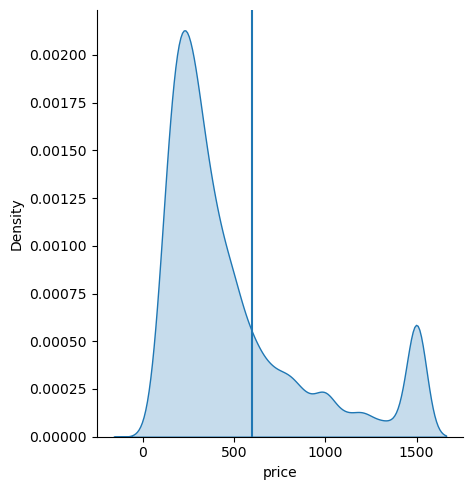

In [4063]:
sns.displot(df, x = "price", kind = "kde", fill = "True")
plt.axvline(600)

In [4064]:
df_rich = df.loc[df.price > 600, :]

### Extracting amenities information

In [4066]:
features = set()

features_dict = {}

features_dict_poor = {}

# Convert the amenities string into a list of amenities
def add_amenities_to_set(amenities):
    amenities_proc = amenities.replace("[", "").replace("]", "").replace('"', "")
    amenitites_splitted = amenities_proc.split(", ")
    features.update(amenitites_splitted)
    
    for amn in amenitites_splitted:
        if amn in features_dict:
            features_dict.update({amn : features_dict[amn] + 1})
        else:
            features_dict.update({amn : 1})
            
def add_amenities_to_set2(amenities):
    amenities_proc = amenities.replace("[", "").replace("]", "").replace('"', "")
    amenitites_splitted = amenities_proc.split(", ")
    features.update(amenitites_splitted)
    
    for amn in amenitites_splitted:
        if amn in features_dict_poor:
            features_dict_poor.update({amn : features_dict_poor[amn] + 1})
        else:
            features_dict_poor.update({amn : 1})

#Check what kind of features the properties with price higher than 80% of the PRICE_CAP
#df_rich = df.loc[df.price >= PRICE_CAP*0.8, :]    
df_rich = df.loc[df.price >= 600, :]    
df_poor = df.loc[df.price < 600, :]    
    
df_rich.amenities.apply(lambda x: add_amenities_to_set(x))
df_poor.amenities.apply(lambda x: add_amenities_to_set2(x))

print(len(features))
features

df_amn_count_rich = pd.DataFrame.from_dict(features_dict, orient='index', columns = ["rich count"])
df_amn_count_rich = df_amn_count_rich.sort_values(by = "rich count", ascending = False)

df_amn_count_poor = pd.DataFrame.from_dict(features_dict_poor, orient='index', columns = ["poor count"])
df_amn_count_poor= df_amn_count_poor.sort_values(by = "poor count", ascending = False)

#features_dict

3843


In [4067]:
print(df_amn_count_rich.shape)
print(df_amn_count_poor.shape)

(1613, 1)
(3271, 1)


In [4068]:
print(df.loc[df.price >= 600, :].shape)    
print(df.loc[df.price < 600, :].shape)   

(5842, 15)
(16242, 15)


In [4069]:
# This Data Frame shows the % of the presence of the amenities for the expensive properties and the cheap properties.
# The diff column shows the difference between these percentages. The goal was to identify the cases where the presence of the amenitiy was higher for
# the expensive properties.

process = df_amn_count_rich.merge(df_amn_count_poor, how="outer", left_index = True, right_index = True).sort_values(by="rich count", ascending = False)


process["rich count"] = (process["rich count"]*100)/(df.loc[df.price >= 600, :].shape[0]) 
process["poor count"] = (process["poor count"]*100)/(df.loc[df.price < 600, :].shape[0]) 
process["diff"] = process["rich count"] - process["poor count"]

process.sort_values(by = "diff", ascending = True).head(30)

,rich count,poor count,diff
Bed linens,50.838754,67.596355,-16.757601
Dishes and silverware,59.003766,73.894841,-14.891075
Hot water,58.147895,72.361778,-14.213884
Laundromat nearby,20.506676,33.148627,-12.641951
Room-darkening shades,34.320438,46.219677,-11.899239
Ceiling fan,14.087641,25.926610,-11.838969
Self check-in,25.213968,37.045930,-11.831962
Long term stays allowed,30.297843,40.857037,-10.559194
Microwave,49.674769,60.220416,-10.545647
Clothing storage: wardrobe,16.312907,26.788573,-10.475666


In [4070]:


######################################################
#List of amenities being considered (TO BE REVISED !)#
######################################################
amenities_list_re = { "parking": ".*parking on premises.*", 
                     "pool":".*pool.*(?!.*\btable\b).*", 
                     "pool_table": ".*pool table.*",
                     "ac1": ".*air conditioning.*",
                     "ac2":".* ac .*",
                     "washer":".*washer.*",
                     "bathtub1": ".*bathtub.*",
                     "bathtub2": ".*hot tub.*",
                     "beach_view1": ".*beach view.*",
                     "beach_view2": ".*sea view.*",
                     "beach_view3": ".*ocean view.*",
                     "beach_access1": ".*waterfront*",
                     "beach_access2": ".*beach access*",
                     "sauna": ".*sauna.*",
                     "gym" : ".*gym.*",
                     "piano": ".*piano.*",
                     "dishwasher": ".*dishwasher.*",
                     "dryer": ".*dryer.*",
                     "ceiling_fan" : ".*ceiling fan.*",
                     "long_term" : ".*long term.*",
                      }
        
    
#Create the has_amenities columns
has_amn_feat = ["has_" + x for x in amenities_list_re.keys()]

#Default value 0 (does not have amenity)
df[has_amn_feat] = 0


def convert_amenities(amenities, index): 
    for amn_name, amn_re in amenities_list_re.items():
        if(re.match(amn_re, str.lower(amenities))):
  
            df.loc[index,"has_"+ amn_name] = 1

for index, row in df.iterrows():
    convert_amenities(df.loc[index, "amenities"], index)

# Merge features
df["has_ac"] = df.apply(lambda x: (x["has_ac1"] or x["has_ac2"]), axis = 1)
df["has_bathtub"] = df.apply(lambda x: (x["has_bathtub1"] or x["has_bathtub2"]), axis = 1)
df["has_seaview"] = df.apply(lambda x: (x["has_beach_view1"] or x["has_beach_view2"] or x["has_beach_view3"]), axis = 1)
df["has_beach_access"] = df.apply(lambda x: (x["has_beach_access1"] or x["has_beach_access2"]), axis = 1)

# Drop aac1 and ac2 and amenities features
df = df.drop(["has_ac1", "has_ac2","has_bathtub1","has_bathtub2","has_beach_view1","has_beach_view2", "has_beach_view3",
              "amenities", "has_beach_access1", "has_beach_access2"], axis = 1)

#df = df.drop(["has_ac1", "has_ac2","has_bathtub1","has_bathtub2","has_beach_view1","has_beach_view2", "has_beach_view3"], axis = 1)

In [4071]:
df_categorical = df.select_dtypes(include = 'object')
df_categorical

,neighbourhood_cleansed
0,Copacabana
1,Copacabana
3,Copacabana
4,Ipanema
5,Copacabana
...,...
34658,Ipanema
34659,Copacabana
34660,Botafogo
34661,Leblon


In [4072]:
# Confirming the absence of missing values
df.isna().sum()

neighbourhood_cleansed    0
latitude                  0
longitude                 0
accommodates              0
bathrooms                 0
bedrooms                  0
beds                      0
price                     0
number_of_reviews         0
number_of_reviews_ltm     0
number_of_reviews_l30d    0
reviews_per_month         0
is_entire_home            0
is_bathroom_shared        0
has_parking               0
has_pool                  0
has_pool_table            0
has_washer                0
has_sauna                 0
has_gym                   0
has_piano                 0
has_dishwasher            0
has_dryer                 0
has_ceiling_fan           0
has_long_term             0
has_ac                    0
has_bathtub               0
has_seaview               0
has_beach_access          0
dtype: int64

In [4073]:
df.columns

Index(['neighbourhood_cleansed', 'latitude', 'longitude', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'price', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'reviews_per_month',
       'is_entire_home', 'is_bathroom_shared', 'has_parking', 'has_pool',
       'has_pool_table', 'has_washer', 'has_sauna', 'has_gym', 'has_piano',
       'has_dishwasher', 'has_dryer', 'has_ceiling_fan', 'has_long_term',
       'has_ac', 'has_bathtub', 'has_seaview', 'has_beach_access'],
      dtype='object')

In [4074]:
df.is_entire_home.value_counts()

is_entire_home
1    18381
0     3703
Name: count, dtype: int64

<Axes: xlabel='accommodates', ylabel='price'>

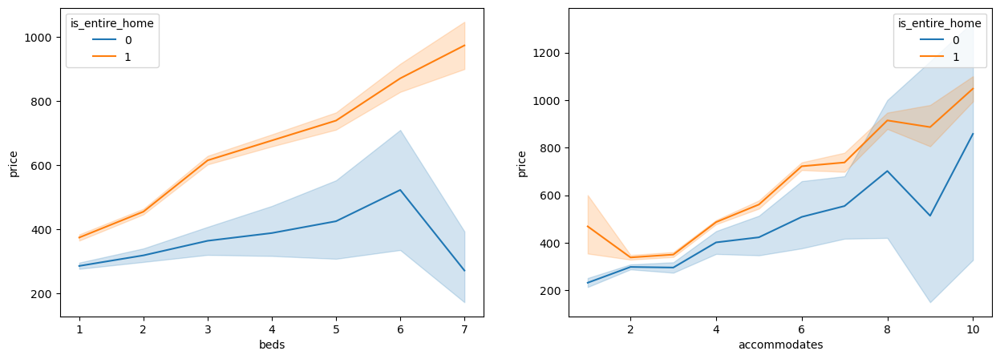

In [4075]:
fig, ax = plt.subplots(1,2, figsize=(15,5))

# Min 1 bed and max 7 beds
sns.lineplot(ax =ax[0] , data = df.loc[(df.beds <=7) & (df.beds > 0),:], x="beds", y="price", hue = "is_entire_home")

# Min 1 ppl and max 10 ppl
sns.lineplot(ax = ax[1], data = df.loc[(df.accommodates <=10) & (df.accommodates > 0),:], x="accommodates", y="price", hue = "is_entire_home")

## Clustering with geolocation

In [4077]:
df.columns

Index(['neighbourhood_cleansed', 'latitude', 'longitude', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'price', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'reviews_per_month',
       'is_entire_home', 'is_bathroom_shared', 'has_parking', 'has_pool',
       'has_pool_table', 'has_washer', 'has_sauna', 'has_gym', 'has_piano',
       'has_dishwasher', 'has_dryer', 'has_ceiling_fan', 'has_long_term',
       'has_ac', 'has_bathtub', 'has_seaview', 'has_beach_access'],
      dtype='object')

In [4078]:
from sklearn.cluster import KMeans

In [4079]:
# Initialize the model
k_means = KMeans(
    init = "random",
    n_clusters = 10,
    n_init = 10,
    max_iter = 500,
    random_state = 69
)


#Prepare the data
df_kmeans = df.loc[:,["latitude", "longitude", "has_beach_access"]]
#df_kmeans = df.loc[:,["latitude", "longitude"]]

# Fitting
k_means.fit(df_kmeans)

#Clusters as a feature
df_kmeans['cluster'] = k_means.labels_ 
df_kmeans['price'] = df.price


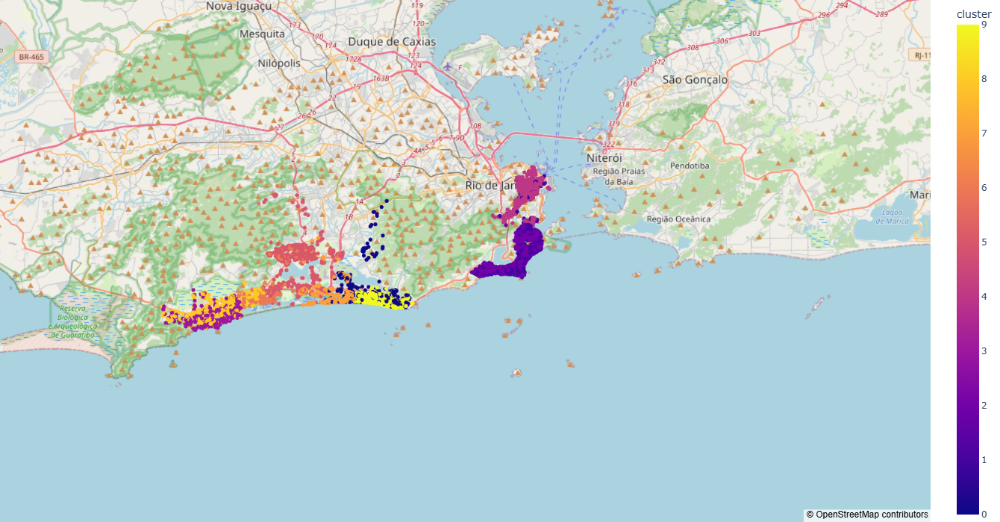

In [4080]:
fig = px.scatter_mapbox(df_kmeans, 
                  lat="latitude", 
                  lon="longitude",     
                  color="cluster",
                  hover_name = "price", 
                  size_max=15, 
                  zoom=10,
                  height = 700,
                  mapbox_style = "open-street-map")


fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")

In [4081]:
# Create afeature with the average price for different zones (not necessarily the same division as the neighbourhood)
df['cluster_zone_beach_access'] = df_kmeans['cluster']

In [4082]:
# Dropping latitude and longitude
# Info alaready capture with the division into different neighbourhoods
df = df.drop(["longitude", "latitude"], axis = 1)

In [4083]:
df.corr(numeric_only = True).price.sort_values(ascending = False)

price                        1.000000
bedrooms                     0.567336
bathrooms                    0.560534
accommodates                 0.473889
beds                         0.388221
has_parking                  0.258883
has_pool                     0.223527
is_entire_home               0.218865
has_bathtub                  0.204136
has_washer                   0.203890
has_dishwasher               0.150385
has_ac                       0.116778
has_gym                      0.097291
has_seaview                  0.093248
cluster_zone_beach_access    0.056253
has_pool_table               0.033675
has_dryer                    0.024260
has_sauna                    0.021830
has_piano                    0.009483
has_beach_access            -0.048903
has_long_term               -0.105320
has_ceiling_fan             -0.133666
is_bathroom_shared          -0.148856
number_of_reviews           -0.190717
number_of_reviews_l30d      -0.203643
number_of_reviews_ltm       -0.255221
reviews_per_

In [4084]:
# Low amenities correlation
#last_drop = ["has_pool", "has_ac","cluster_zone_beach_access" , "has_sauna", "has_piano", "has_beach_access", "has_pool_table", "has_dryer", "has_long_term"]
last_drop = ["has_sauna", "has_piano", "has_beach_access", "has_pool_table", "has_dryer", "has_long_term"]

df = df.drop(last_drop, axis = 1)

In [4085]:
df.head()

,neighbourhood_cleansed,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,reviews_per_month,...,has_parking,has_pool,has_washer,has_gym,has_dishwasher,has_ceiling_fan,has_ac,has_bathtub,has_seaview,cluster_zone_beach_access
0,Copacabana,5,1.0,2.0,2.0,310.0,319,23,1,1.88,...,0,0,0,0,0,0,1,1,0,2
1,Copacabana,3,1.0,1.0,2.0,203.0,291,23,1,1.70,...,0,0,0,0,0,1,1,0,0,1
3,Copacabana,2,1.5,1.0,1.0,201.0,476,36,5,2.85,...,0,0,0,0,0,0,1,0,1,1
4,Ipanema,2,1.0,1.0,1.0,321.0,471,17,1,3.04,...,0,0,1,0,0,1,1,0,0,1
5,Copacabana,2,1.0,1.0,1.0,160.0,162,18,1,1.05,...,0,0,0,0,0,0,1,0,0,2


### Binary Encoding option

In [4087]:
import category_encoders as ce
#bin_encoder = ce.BinaryEncoder(cols = ['neighbourhood_cleansed'] , return_df = True)
bin_encoder = ce.BinaryEncoder(cols = ['neighbourhood_cleansed', 'cluster_zone_beach_access'] , return_df = True)
#bin_encoder = ce.BinaryEncoder(cols = ['neighbourhood_cleansed', 'cluster_zone_beach_access', 'property_type'] , return_df = True)

df_bin = bin_encoder.fit_transform(df.drop("price", axis = 1))

### Label Encoding

In [4089]:
from sklearn import preprocessing 

label_encoder = preprocessing.LabelEncoder() 

df_label = df.drop("price", axis = 1).copy(deep = True)
df_label["neighbourhood_cleansed"] = label_encoder.fit_transform(df_label["neighbourhood_cleansed"])
df_label["cluster_zone_beach_access"] = label_encoder.fit_transform(df_label["cluster_zone_beach_access"])
#df_label["property_type"] = label_encoder.fit_transform(df_label["property_type"])

### One-Hod-Encoding option

In [4091]:
## Another option could be with get_dummies
from sklearn.preprocessing import OneHotEncoder

onehot_encoder_neighbourhood = OneHotEncoder(sparse_output = False)
onehot_encoder_cluster = OneHotEncoder(sparse_output = False, feature_name_combiner='concat')
#onehot_encoder_property = OneHotEncoder(sparse_output = False)

series_onehot = onehot_encoder_neighbourhood.fit_transform(df[["neighbourhood_cleansed"]])

series_cluster_onehot = onehot_encoder_cluster.fit_transform(df[["cluster_zone_beach_access"]])

#series_property_onehot = onehot_encoder_property.fit_transform(df[["property_type"]])

In [4092]:
df_onehot = df.drop("price", axis = 1).copy(deep = True)
df_onehot[onehot_encoder_neighbourhood.categories_[0]] = series_onehot
df_onehot = df_onehot.drop("neighbourhood_cleansed", axis = 1)

df_onehot[onehot_encoder_cluster.categories_[0]] = series_cluster_onehot
df_onehot = df_onehot.drop("cluster_zone_beach_access", axis = 1)

#df_onehot[onehot_encoder_property.categories_[0]] = series_property_onehot
#df_onehot = df_onehot.drop("property_type", axis = 1)

In [4093]:

#Make sure all the features NAME are of type string to avoid error in the normalisation step bellow where it was
# raising an exception for different types for the feature name
df_onehot.columns = [x if isinstance(x, str) else str(x) for x in df_onehot.columns]

df_onehot.columns

Index(['accommodates', 'bathrooms', 'bedrooms', 'beds', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'reviews_per_month',
       'is_entire_home', 'is_bathroom_shared', 'has_parking', 'has_pool',
       'has_washer', 'has_gym', 'has_dishwasher', 'has_ceiling_fan', 'has_ac',
       'has_bathtub', 'has_seaview', 'Barra da Tijuca', 'Botafogo', 'Centro',
       'Copacabana', 'Ipanema', 'Jacarepaguá', 'Leblon',
       'Recreio dos Bandeirantes', 'Santa Teresa', '0', '1', '2', '3', '4',
       '5', '6', '7', '8', '9'],
      dtype='object')

In [4094]:
df_onehot["price"] = df["price"]

## Normalisation

In [4096]:
from sklearn.preprocessing import MinMaxScaler

# Normalise all the 3 types of encoding dataset above
scaler = MinMaxScaler()
df_bin = pd.DataFrame(scaler.fit_transform(df_bin), columns= df_bin.columns, index = df_bin.index)
df_label = pd.DataFrame(scaler.fit_transform(df_label), columns= df_label.columns, index = df_label.index)
df_onehot = pd.DataFrame(scaler.fit_transform(df_onehot), columns= df_onehot.columns, index = df_onehot.index)

df_bin["price"] = df["price"]
df_label["price"] = df["price"]
df_onehot["price"] = df["price"]


### Save all the datasets

In [4098]:
df_bin.to_csv("Data/df_bin.csv")
df_label.to_csv("Data/df_label.csv")
df_onehot.to_csv("Data/df_onehot.csv")

In [4099]:
#################
# TO BE REVISED #
#################

#Check the "review" features that were dropped before

In [4100]:
df.corr(numeric_only = True).price

accommodates                 0.473889
bathrooms                    0.560534
bedrooms                     0.567336
beds                         0.388221
price                        1.000000
number_of_reviews           -0.190717
number_of_reviews_ltm       -0.255221
number_of_reviews_l30d      -0.203643
reviews_per_month           -0.281140
is_entire_home               0.218865
is_bathroom_shared          -0.148856
has_parking                  0.258883
has_pool                     0.223527
has_washer                   0.203890
has_gym                      0.097291
has_dishwasher               0.150385
has_ceiling_fan             -0.133666
has_ac                       0.116778
has_bathtub                  0.204136
has_seaview                  0.093248
cluster_zone_beach_access    0.056253
Name: price, dtype: float64

In [4101]:
df_onehot.corr()

,accommodates,bathrooms,bedrooms,beds,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,reviews_per_month,is_entire_home,is_bathroom_shared,...,1,2,3,4,5,6,7,8,9,price
accommodates,1.000000,0.617500,0.753641,0.763266,-0.009492,-0.019892,-0.016959,-0.036989,0.380902,-0.217287,...,-0.000951,-0.008339,0.049445,-0.116263,0.018607,0.019278,0.017073,0.060107,0.026150,0.473889
bathrooms,0.617500,1.000000,0.756422,0.552442,-0.074539,-0.114162,-0.094848,-0.138498,0.155062,-0.070369,...,-0.044689,-0.007956,0.035628,-0.107348,0.043535,0.010119,0.014342,0.099937,0.033044,0.560534
bedrooms,0.753641,0.756422,1.000000,0.705212,-0.070040,-0.104468,-0.079650,-0.123578,0.259047,-0.144064,...,-0.047253,0.010556,0.030010,-0.112929,0.066165,0.041294,0.002343,0.080483,0.014501,0.567336
beds,0.763266,0.552442,0.705212,1.000000,0.006996,-0.024288,-0.028579,-0.046408,0.276381,-0.156810,...,0.006140,-0.020050,0.034222,-0.100355,0.044601,0.027389,0.000318,0.042409,0.025225,0.388221
number_of_reviews,-0.009492,-0.074539,-0.070040,0.006996,1.000000,0.685613,0.398781,0.541534,0.069573,-0.000945,...,0.163675,-0.060818,-0.023124,-0.021533,-0.078677,-0.011540,0.015534,-0.067789,-0.003090,-0.190717
number_of_reviews_ltm,-0.019892,-0.114162,-0.104468,-0.024288,0.685613,1.000000,0.679923,0.842312,0.109349,-0.025886,...,0.216607,-0.099658,-0.015722,-0.014274,-0.103003,-0.011180,0.015431,-0.085702,0.002741,-0.255221
number_of_reviews_l30d,-0.016959,-0.094848,-0.079650,-0.028579,0.398781,0.679923,1.000000,0.760693,0.103195,-0.043656,...,0.153209,-0.060382,-0.024567,0.004536,-0.080319,-0.005071,0.016108,-0.063242,-0.015258,-0.203643
reviews_per_month,-0.036989,-0.138498,-0.123578,-0.046408,0.541534,0.842312,0.760693,1.000000,0.121758,-0.048778,...,0.192598,-0.084197,-0.008155,0.007272,-0.106945,-0.009725,0.019814,-0.084928,-0.004734,-0.281140
is_entire_home,0.380902,0.155062,0.259047,0.276381,0.069573,0.109349,0.103195,0.121758,1.000000,-0.577865,...,0.044333,0.021867,0.002620,-0.105903,-0.021609,-0.003849,0.019948,-0.013269,0.023849,0.218865
is_bathroom_shared,-0.217287,-0.070369,-0.144064,-0.156810,-0.000945,-0.025886,-0.043656,-0.048778,-0.577865,1.000000,...,0.001421,-0.008670,-0.021215,0.062770,0.007093,0.001209,-0.021590,-0.012298,-0.028951,-0.148856
